In [1]:
import os
import numpy as np
from rlr_audio_propagation import Context, Config, ChannelLayout, ChannelLayoutType

In [2]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import soundfile as sf

In [3]:

def plot(fname, out_fname):
    y, sr = librosa.load(fname, mono=False)
    plt.figure(figsize=(10, 6))
    for i, yi in enumerate(y):
        print((yi!=0).sum(), yi.shape)
        ix=np.where(yi!=0)[0]
        if len(ix)>1:
            yi = yi[ix[0]:ix[-1]]
        # print(ix)
        # yi = yi[:200]
        librosa.display.waveshow(yi, sr=sr, alpha=0.5, label=f'Channel {i} ({np.abs(yi).max():.2g})')
    plt.legend()
    plt.savefig(out_fname)
# plot(f'{out_dir}/{name}.wav', f'{out_dir}/{name}.png')


In [4]:
cfg = Config()
print(cfg)
ctx = Context(cfg)
ctx.add_source()
ctx.add_listener(ChannelLayout(ChannelLayoutType.Ambisonics, 4))
ctx.add_object()

Config(  
  frequency_bands=4, 
  direct_sh_order=3, 
  indirect_sh_order=1, 
  direct_ray_count=500, 
  indirect_ray_count=5000, 
  indirect_ray_depth=200, 
  source_ray_count=200, 
  source_ray_depth=10, 
  max_diffraction_order=10, 
  thread_count=1, 
  sample_rate=44100, 
  max_ir_length=4, 
  unit_scale=1, 
  global_volume=1, 
  hrtf_right=[1, 0, 0], 
  hrtf_up=[0, 1, 0], 
  hrtf_back=[0, 0, 1], 
  direct=True, 
  indirect=True, 
  diffraction=True, 
  transmission=True, 
  mesh_simplification=False, 
  temporal_coherence=False
)
CreateContext: Context created


In [3]:
glb_file = "/datasets/soundspaces/scene_datasets/mp3d_example/17DRP5sb8fy/17DRP5sb8fy.glb"
# glb_file = "/datasets/soundspaces/scene_datasets/gibson_data/gibson/Oyens.glb"
out_dir = "output"

mic_pos = np.array([-4, 1, -2])
source_pos = np.array([0, 1.5, -2])
mic_pos = np.array([0, 0, 1])
source_pos = np.array([0, 0, 1.5])

In [4]:
import trimesh
scene = trimesh.load(glb_file)
# rotation_matrix = trimesh.transformations.rotation_matrix(-np.radians(90), [1, 0, 0])
# scene.apply_transform(rotation_matrix)
# scene.geometry['defaultobject'].visual = scene.geometry['defaultobject'].visual.to_color()
# scene.geometry['defaultobject'].visual.face_colors = [255, 235, 255]

def add_sphere(pos, color=[0,0,0], r=0.2, **kw):
    sphere = trimesh.creation.uv_sphere(radius=r)
    sphere.apply_translation(pos)
    sphere.visual.face_colors = color
    scene.add_geometry(sphere)

# mic
add_sphere(mic_pos,[255, 0, 0])
add_sphere(source_pos,[0, 255, 0])
# add_sphere([0, 0, 0])
# add_sphere([0, 2.5, 0])
# add_sphere([0, 2, -1])
# add_sphere([0, 2, 0])
# add_sphere([0, 2, 2])
# add_sphere([0, 2, 4])
# add_sphere([0, 2, 8])
# add_sphere([0, 2, 10])
# add_sphere([-1, 2, 0])
# add_sphere([1, 2, 0])
# add_sphere([2, 2, 0])
# add_sphere([4, 2, 0])
# add_sphere([6, 2, 0])
scene.add_geometry(trimesh.creation.axis())
scene.show()

In [ ]:
xs = np.linspace(-10, 20, 30)
ys = [1.5]
zs = np.linspace(-10, 20, 30)
mic_pos=np.array([0, 0, 1])
X = np.zeros((len(xs), len(zs)))
for i, x in enumerate(xs):
    for j, y in enumerate(ys):
        for k, z in enumerate(zs):
            source_pos = np.array([x, y, z])
            # ctx.clear_sources()
            # ctx.clear_listeners()
            # ctx.add_source()
            # ctx.add_listener(ChannelLayout(ChannelLayoutType.Ambisonics, 4))
            ctx.set_source_position(0, source_pos)
            ctx.set_listener_position(0, mic_pos)
            X[i, k] = ctx.get_indirect_ray_efficiency()
plt.imshow(X)

: 

27237 (27243,)
27235 (27243,)
27233 (27243,)
27231 (27243,)
1
54485
(54485,)
(54485,)
(54485,)
(54485,)


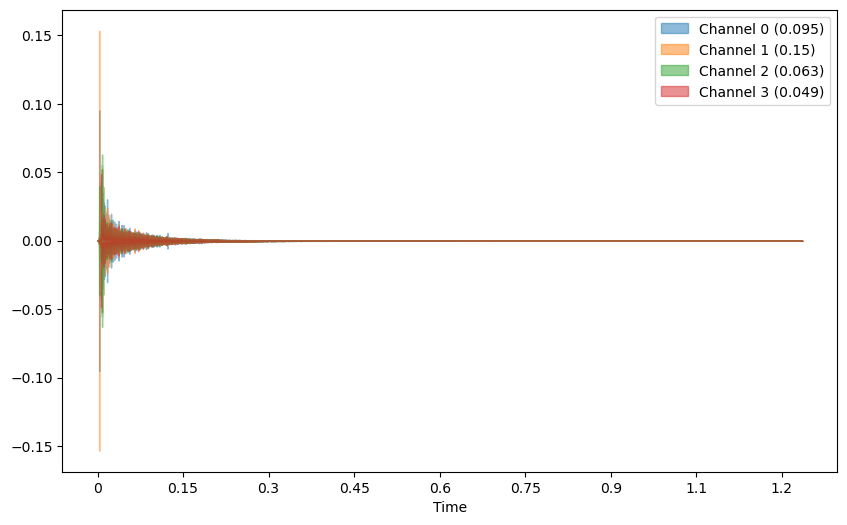

In [74]:
ply_file = glb_file.rsplit('.', 1)[0] + '_semantic.ply'
name = os.path.basename(glb_file).rsplit('.', 1)[0]


ctx.set_source_position(0, mic_pos)
ctx.set_source_radius(0, 1)
ctx.set_listener_position(0, source_pos)
# ctx.set_listener_radius(0, 0.1)
ctx.set_object_position(0, [0, 0, 0])
ctx.set_object_mesh_obj(0, glb_file, "")
ctx.set_object_mesh_ply(0, ply_file, "")

ctx.simulate()

# write to file
os.makedirs(out_dir, exist_ok=True)
ctx.write_ir_wave(0, 0, f'{out_dir}/{name}.wav')
ctx.write_ir_metrics(0, 0, f'{out_dir}/{name}')
plot(f'{out_dir}/{name}.wav', f'{out_dir}/{name}.png')

# alternative way to get audio data
print(ctx.get_ir_count())
irs = []
for i in range(ctx.get_listener_count()):
    for j in range(ctx.get_source_count()):
        print(ctx.get_ir_sample_count(i, j))
        for k in range(ctx.get_ir_channel_count(i, j)):
            y = np.array(ctx.get_ir_channel(i, j, k))
            print(y.shape)

In [73]:
ctx.get_indirect_ray_efficiency()

0.6929017305374146